# Прогнозирование оттока клиентов в сети отелей «Как в гостях»

- Заказчик этого исследования — сеть отелей «Как в гостях».
- Чтобы привлечь клиентов, эта сеть отелей добавила на свой сайт возможность забронировать номер без предоплаты. Однако если клиент отменял бронирование, то компания терпела убытки. Сотрудники отеля могли, например, закупить продукты к приезду гостя или просто не успеть найти другого клиента.
- Чтобы решить эту проблему, вам нужно разработать систему, которая предсказывает отказ от брони. Если модель покажет, что бронь будет отменена, то клиенту предлагается внести депозит. Размер депозита — 80% от стоимости номера. Деньги будут списаны со счёта клиента, если он всё же отменит бронь.

## Шаг 1. Откройте файлы с данными

In [689]:
import pandas as pd
import numpy as np
import pandas_profiling
%matplotlib inline
import matplotlib.pyplot as plt
from catboost import CatBoostClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder 
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score 
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

In [690]:
data_target = pd.read_csv(url)
data_test = pd.read_csv(url)

In [691]:
pandas_profiling.ProfileReport(data_target)

In [692]:
data_target

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights
0,0,0,7.0,2015,July,27,1,0,1,1.0,0.0,0.0,BB,GBR,Direct,0,0,0,A,0,0,Transient,0,0,1
1,1,0,14.0,2015,July,27,1,0,2,2.0,0.0,0.0,BB,GBR,TA/TO,0,0,0,A,0,0,Transient,0,1,2
2,2,0,0.0,2015,July,27,1,0,2,2.0,0.0,0.0,BB,PRT,Direct,0,0,0,C,0,0,Transient,0,0,2
3,3,0,9.0,2015,July,27,1,0,2,2.0,0.0,0.0,FB,PRT,Direct,0,0,0,C,0,0,Transient,0,1,2
4,4,1,85.0,2015,July,27,1,0,3,2.0,0.0,0.0,BB,PRT,TA/TO,0,0,0,A,0,0,Transient,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65224,84057,0,23.0,2016,December,53,30,2,4,2.0,0.0,0.0,BB,CHN,TA/TO,0,0,0,D,0,0,Transient,0,2,6
65225,84063,0,53.0,2016,December,53,31,2,3,2.0,0.0,0.0,HB,FRA,TA/TO,0,0,0,D,0,0,Transient,0,3,5
65226,84094,0,7.0,2016,December,53,31,2,4,2.0,0.0,0.0,BB,FRA,TA/TO,0,0,0,D,0,0,Transient,0,1,6
65227,84117,0,17.0,2016,December,53,30,2,5,2.0,0.0,0.0,SC,FRA,TA/TO,0,0,0,A,0,0,Transient,0,1,7


In [693]:
data_test

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights
0,6086,1,74.0,2017,January,1,1,1,0,2.0,0.0,0.0,BB,PRT,TA/TO,0,0,0,A,0,0,Transient,0,0,1
1,6087,1,62.0,2017,January,1,1,2,2,2.0,0.0,0.0,BB,AUT,TA/TO,0,0,0,A,0,0,Transient,0,1,4
2,6088,1,62.0,2017,January,1,1,2,2,2.0,0.0,0.0,BB,AUT,TA/TO,0,0,0,A,0,0,Transient,0,1,4
3,6089,1,71.0,2017,January,1,1,2,2,1.0,0.0,0.0,BB,PRT,TA/TO,0,0,0,A,0,0,Transient,0,1,4
4,6090,1,172.0,2017,January,1,1,2,5,2.0,0.0,0.0,BB,BEL,TA/TO,0,0,0,A,0,0,Transient,0,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32407,97899,0,164.0,2017,August,35,31,2,4,2.0,0.0,0.0,BB,DEU,TA/TO,0,0,0,A,0,0,Transient,0,0,6
32408,97900,0,21.0,2017,August,35,30,2,5,2.0,0.0,0.0,BB,BEL,TA/TO,0,0,0,A,0,0,Transient,0,2,7
32409,97901,0,23.0,2017,August,35,30,2,5,2.0,0.0,0.0,BB,BEL,TA/TO,0,0,0,A,0,0,Transient,0,0,7
32410,97902,0,34.0,2017,August,35,31,2,5,2.0,0.0,0.0,BB,DEU,TA/TO,0,0,0,D,0,0,Transient,0,4,7


В таблицах hotel_train и hotel_test содержатся одинаковые столбцы:
- id — номер записи;
- adults — количество взрослых постояльцев;
- arrival_date_year — год заезда;
- arrival_date_month — месяц заезда;
- arrival_date_week_number — неделя заезда;
- arrival_date_day_of_month — день заезда;
- babies — количество младенцев;
- booking_changes — количество изменений параметров заказа;
- children — количество детей от 3 до 14 лет;
- country — гражданство постояльца;
- customer_type — тип заказчика:
    - Contract — договор с юридическим лицом;
    - Group — групповой заезд;
    - Transient — не связано с договором или групповым заездом;
    - Transient-party — не связано с договором или групповым заездом, но связано с бронированием типа Transient.
- days_in_waiting_list — сколько дней заказ ожидал подтверждения;
- distribution_channel — канал дистрибуции заказа;
- is_canceled — отмена заказа;
- is_repeated_guest — признак того, что гость бронирует номер второй раз;
- lead_time — количество дней между датой бронирования и датой прибытия;
- meal — опции заказа:
    - SC — нет дополнительных опций;
    - BB — включён завтрак;
    - HB — включён завтрак и обед;
    - FB — включён завтрак, обед и ужин.
- previous_bookings_not_canceled — количество подтверждённых заказов у клиента;
- previous_cancellations — количество отменённых заказов у клиента;
- required_car_parking_spaces — необходимость места для автомобиля;
- reserved_room_type — тип забронированной комнаты;
- stays_in_weekend_nights — количество ночей в выходные дни;
- stays_in_week_nights — количество ночей в будние дни;
- total_nights — общее количество ночей;
- total_of_special_requests — количество специальных отметок.

In [694]:
data_target.describe().T

,count,mean,std,min,25%,50%,75%,max
id,65229.0,43544.069172,25614.858971,0.0,19108.0,40554.0,67414.0,84121.0
is_canceled,65229.0,0.368609,0.482431,0.0,0.0,0.0,1.0,1.0
lead_time,65229.0,96.337917,96.127545,0.0,17.0,64.0,151.0,374.0
arrival_date_year,65229.0,2015.719021,0.449481,2015.0,2015.0,2016.0,2016.0,2016.0
arrival_date_week_number,65229.0,31.339772,13.464024,1.0,21.0,34.0,42.0,53.0
arrival_date_day_of_month,65229.0,15.847813,8.748182,1.0,8.0,16.0,23.0,31.0
stays_in_weekend_nights,65229.0,0.825185,0.853477,0.0,0.0,1.0,2.0,4.0
stays_in_week_nights,65229.0,2.224793,1.354992,0.0,1.0,2.0,3.0,6.0
adults,65229.0,1.836576,0.480245,0.0,2.0,2.0,2.0,4.0
children,65229.0,0.074890,0.334243,0.0,0.0,0.0,0.0,3.0


In [695]:
data_test.describe().T

,count,mean,std,min,25%,50%,75%,max
id,32412.0,60131.505183,29953.586177,6086.0,45291.75,53394.5,89800.25,97903.0
is_canceled,32412.0,0.388467,0.487409,0.0,0.00,0.0,1.00,1.0
lead_time,32412.0,97.587869,86.507146,0.0,23.00,76.0,155.00,373.0
arrival_date_year,32412.0,2017.000000,0.000000,2017.0,2017.00,2017.0,2017.00,2017.0
arrival_date_week_number,32412.0,17.804054,9.177384,1.0,10.00,18.0,25.00,35.0
arrival_date_day_of_month,32412.0,15.656948,8.766429,1.0,8.00,15.5,23.00,31.0
stays_in_weekend_nights,32412.0,0.867888,0.853394,0.0,0.00,1.0,2.00,4.0
stays_in_week_nights,32412.0,2.340090,1.375170,0.0,1.00,2.0,3.00,6.0
adults,32412.0,1.858602,0.489341,0.0,2.00,2.0,2.00,4.0
children,32412.0,0.083765,0.343470,0.0,0.00,0.0,0.00,3.0


### Вывод

- есть два датасета `data_target` за 2015 и 2016 год для обучения модели на 65229  rows × 25 columns и `data_test` за 2017 год для тестирования модели на 32412 rows × 25 columns.
- высокая корреляция:
    - `total_nights`  с `stays_in_weekend_nights`, `stays_in_week_nights`; 
    - `previous_bookings_not_canceled` с `is_repeated_guest`.
- много нулевых значений:
    - `previous_cancellations` has 59591 (91.4%) — количество отменённых заказов у клиента;
    - `previous_bookings_not_canceled` has 63686 (97.6%) — количество подтверждённых заказов у клиента;
    - `booking_changes` has 56195 (86.2%) — количество изменений параметров заказа;
    - `days_in_waiting_list` has 62005 (95.1%) — сколько дней заказ ожидал подтверждения.

## Шаг 2. Предобработка и исследовательский анализ данных

- Проверьте данные и откорректируйте их, если потребуется.
- Проведите исследовательский анализ представленных данных. Опишите найденные особенности: пропуски, выбросы.

<AxesSubplot:>

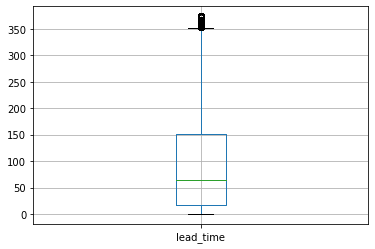

In [696]:
data_target.lead_time.to_frame().boxplot()

В столбце `lead_time` есть выбросы.

In [697]:
data_target.customer_type.unique()

array(['Transient', 'Contract', 'Transient-Party', 'Group'], dtype=object)

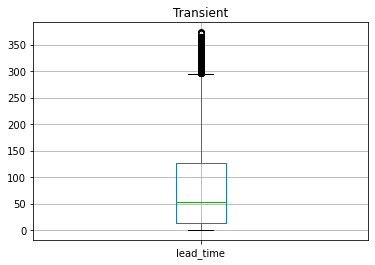

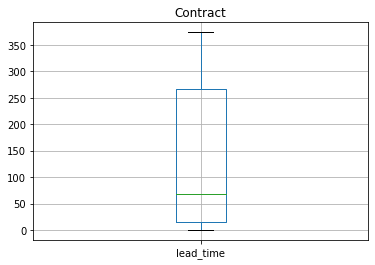

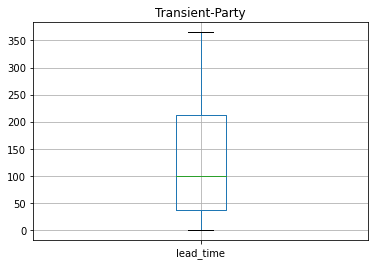

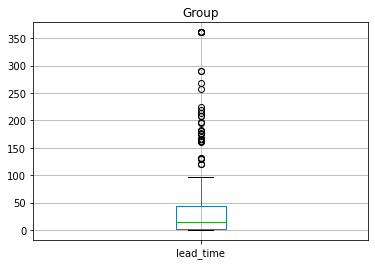

In [698]:
for customer in data_target.customer_type.unique():
    data_target[data_target['customer_type']==customer].lead_time.to_frame().boxplot()
    plt.title(customer)
    plt.show()

<AxesSubplot:>

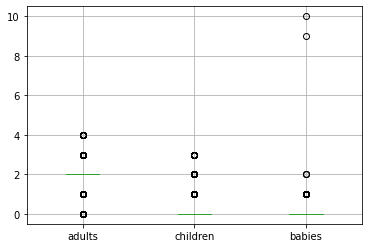

In [699]:
data_target.dropna().boxplot(['adults', 'children', 'babies'])

In [700]:
data_target[['adults', 'children', 'babies']].mean()

adults      1.836576
children    0.074890
babies      0.007236
dtype: float64

In [701]:
data_target[['adults', 'children', 'babies']].median()

adults      2.0
children    0.0
babies      0.0
dtype: float64

In [702]:
data_target.meal.value_counts()

BB           51697
HB            7292
SC            5274
SC             515
FB             451
Name: meal, dtype: int64

Есть одинаковые значения SC, скорее всего есть пробелы после либо перед буквами уберем их.

In [703]:
data_target.meal = data_target.meal.apply(str)
data_target.meal = data_target.meal.apply(lambda x: x.strip())

In [704]:
data_test.meal = data_test.meal.apply(str)
data_test.meal = data_test.meal.apply(lambda x: x.strip())

In [705]:
data_target.meal.value_counts()

BB    51697
HB     7292
SC     5789
FB      451
Name: meal, dtype: int64

In [706]:
data_target.distribution_channel.value_counts()

TA/TO        54454
Direct        6853
Corporate     3823
GDS             99
Name: distribution_channel, dtype: int64

In [707]:
data_target.isna().mean()

id                                0.0
is_canceled                       0.0
lead_time                         0.0
arrival_date_year                 0.0
arrival_date_month                0.0
arrival_date_week_number          0.0
arrival_date_day_of_month         0.0
stays_in_weekend_nights           0.0
stays_in_week_nights              0.0
adults                            0.0
children                          0.0
babies                            0.0
meal                              0.0
country                           0.0
distribution_channel              0.0
is_repeated_guest                 0.0
previous_cancellations            0.0
previous_bookings_not_canceled    0.0
reserved_room_type                0.0
booking_changes                   0.0
days_in_waiting_list              0.0
customer_type                     0.0
required_car_parking_spaces       0.0
total_of_special_requests         0.0
total_nights                      0.0
dtype: float64

### Вывод

- Пропусков нет.
- В столбцах `meal` были одинаковые значения SC.

## Шаг 3. Формулировка ML-задачи на основе бизнес-задачи

Составьте бизнес-модель отеля. Оцените его выручку без внедрения депозитов.

Основная бизнес-метрика для любой сети отелей — её прибыль. Прибыль отеля — это разница между стоимостью номера за все ночи и затраты на разовое обслуживание: как при подготовке номера, так и при проживании постояльца.
В отеле есть несколько типов номеров. В зависимости от типа номера назначается стоимость за одну ночь. Есть также затраты на уборку. Если клиент снял номер надолго, то убираются каждые два дня.
Стоимость номеров отеля:
- категория A: за ночь — 1 000, разовое обслуживание — 400;
- категория B: за ночь — 800, разовое обслуживание — 350;
- категория C: за ночь — 600, разовое обслуживание — 350;
- категория D: за ночь — 550, разовое обслуживание — 150;
- категория E: за ночь — 500, разовое обслуживание — 150;
- категория F: за ночь — 450, разовое обслуживание — 150;
- категория G: за ночь — 350, разовое обслуживание — 150.

В ценовой политике отеля используются сезонные коэффициенты: весной и осенью цены повышаются на 20%, летом — на 40%.
На разработку системы прогнозирования заложен бюджет — 400 000. При этом необходимо учесть, что внедрение модели должно окупиться. Затраты на разработку должны быть меньше той выручки, которую система принесёт компании.

In [708]:
df = pd.DataFrame({'reserved_room_type' : ['A', 'B', 'C', 'D', 'E', 'F', 'G'], 
                    'price' : [1000, 800, 600, 550, 500, 450, 350],
                    'service' : [400, 350, 350, 150, 150, 150, 150]
                 })
df

,reserved_room_type,price,service
0,A,1000,400
1,B,800,350
2,C,600,350
3,D,550,150
4,E,500,150
5,F,450,150
6,G,350,150


In [709]:
data_target.reserved_room_type = data_target.reserved_room_type.apply(lambda x: x.strip())
data_test.reserved_room_type = data_test.reserved_room_type.apply(lambda x: x.strip())

In [710]:
pd.set_option('display.max_columns', 150) # ДЛЯ ПРОСМОТРА ВСЕХ СТОЛБЦОВ В ТАБЛИЦЕ

new_data_target = data_target.merge(df, on='reserved_room_type')
new_data_target

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights,price,service
0,0,0,7.0,2015,July,27,1,0,1,1.0,0.0,0.0,BB,GBR,Direct,0,0,0,A,0,0,Transient,0,0,1,1000,400
1,1,0,14.0,2015,July,27,1,0,2,2.0,0.0,0.0,BB,GBR,TA/TO,0,0,0,A,0,0,Transient,0,1,2,1000,400
2,4,1,85.0,2015,July,27,1,0,3,2.0,0.0,0.0,BB,PRT,TA/TO,0,0,0,A,0,0,Transient,0,1,3,1000,400
3,10,0,0.0,2015,July,27,1,0,1,2.0,0.0,0.0,BB,FRA,Corporate,0,0,0,A,0,0,Transient,0,0,1,1000,400
4,12,0,72.0,2015,July,27,1,2,4,2.0,0.0,0.0,BB,PRT,Direct,0,0,0,A,1,0,Transient,0,1,6,1000,400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65224,83634,0,248.0,2016,December,52,24,2,3,2.0,0.0,0.0,BB,FRA,TA/TO,0,0,0,B,1,0,Transient,0,1,5,800,350
65225,83828,0,353.0,2016,December,53,29,1,3,2.0,0.0,0.0,BB,AUT,TA/TO,0,0,0,B,6,0,Transient-Party,0,0,4,800,350
65226,83829,0,352.0,2016,December,53,29,1,3,2.0,0.0,0.0,BB,AUT,TA/TO,0,0,0,B,1,0,Transient-Party,0,0,4,800,350
65227,84008,0,258.0,2016,December,53,28,2,5,1.0,1.0,0.0,BB,CHE,TA/TO,0,0,0,B,2,0,Transient,0,3,7,800,350


In [711]:
data_target.reserved_room_type.value_counts()

A    50501
D     9387
E     2448
F     1213
B      860
G      592
C      228
Name: reserved_room_type, dtype: int64

In [712]:
new_data_test = data_test.merge(df, on='reserved_room_type')
new_data_test

,id,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_nights,price,service
0,6086,1,74.0,2017,January,1,1,1,0,2.0,0.0,0.0,BB,PRT,TA/TO,0,0,0,A,0,0,Transient,0,0,1,1000,400
1,6087,1,62.0,2017,January,1,1,2,2,2.0,0.0,0.0,BB,AUT,TA/TO,0,0,0,A,0,0,Transient,0,1,4,1000,400
2,6088,1,62.0,2017,January,1,1,2,2,2.0,0.0,0.0,BB,AUT,TA/TO,0,0,0,A,0,0,Transient,0,1,4,1000,400
3,6089,1,71.0,2017,January,1,1,2,2,1.0,0.0,0.0,BB,PRT,TA/TO,0,0,0,A,0,0,Transient,0,1,4,1000,400
4,6090,1,172.0,2017,January,1,1,2,5,2.0,0.0,0.0,BB,BEL,TA/TO,0,0,0,A,0,0,Transient,0,0,7,1000,400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32407,97443,0,110.0,2017,August,34,20,2,4,2.0,0.0,0.0,BB,COL,Direct,0,0,0,B,3,0,Transient-Party,0,1,6,800,350
32408,97610,0,6.0,2017,August,34,26,1,1,1.0,0.0,0.0,BB,PRT,Direct,0,0,0,B,2,0,Transient,0,1,2,800,350
32409,97612,0,3.0,2017,August,34,26,1,1,2.0,0.0,0.0,BB,PRT,Direct,0,0,0,B,1,0,Transient,0,1,2,800,350
32410,97623,0,234.0,2017,August,34,26,2,1,2.0,0.0,0.0,BB,ESP,Direct,0,0,0,B,1,0,Transient,1,0,3,800,350


In [713]:
new_data_test.reserved_room_type.value_counts()

A    23471
D     6123
E     1644
F      503
G      278
C      201
B      192
Name: reserved_room_type, dtype: int64

Весной и осенью цены повышаются на 20%, летом — на 40%, добавляю эти значения в новый столбец.

In [714]:
new_data_target['seasonal_coefficient'] = np.where(new_data_target['arrival_date_month']
                                            .isin(['September', 'November', 'October', 'March', 'April', 'May']),
                                            1.2,
                                            1)

In [715]:
new_data_target['seasonal_coefficient'] = np.where(new_data_target['arrival_date_month']
                                            .isin(['June', 'July', 'August',]),
                                            1.4,
                                            new_data_target['seasonal_coefficient'])

In [716]:
new_data_test['seasonal_coefficient'] = np.where(new_data_test['arrival_date_month']
                                            .isin(['September', 'November', 'October', 'March', 'April', 'May']),
                                            1.2,
                                            1)

In [717]:
new_data_test['seasonal_coefficient'] = np.where(new_data_test['arrival_date_month']
                                            .isin(['June', 'July', 'August',]),
                                            1.4,
                                            new_data_test['seasonal_coefficient'])

In [718]:
new_data_target[['seasonal_coefficient', 'total_nights', 'price', 'service', 'is_canceled']]

,seasonal_coefficient,total_nights,price,service,is_canceled
0,1.4,1,1000,400,0
1,1.4,2,1000,400,0
2,1.4,3,1000,400,1
3,1.4,1,1000,400,0
4,1.4,6,1000,400,0
...,...,...,...,...,...
65224,1.0,5,800,350,0
65225,1.0,4,800,350,0
65226,1.0,4,800,350,0
65227,1.0,7,800,350,0


Расчет прибыли от клиентов, которые не отменили бронирование:
- умножаю цену на сезонный коэффициент;
- отнимаю разовое обслуживание при заселении;
- умножаю на количество ночей;
- отнимаю разовое обслуживание, если клиент жил больше 2 ночей;
- умножаю на тех кто не отменил бронирования.

In [719]:
 new_data_target['profit'] = ((new_data_target.price * new_data_target.seasonal_coefficient - new_data_target.service) *
                              new_data_target.total_nights - new_data_target.service * 
                              ((new_data_target.total_nights - 1) // 2)
                             ) * (1 - new_data_target.is_canceled)

In [720]:
 new_data_target['profit'].sum()

80235420.0

In [721]:
new_data_target[new_data_target['is_canceled'] == 0][['seasonal_coefficient', 'total_nights', 'price', 'service', 'is_canceled','profit']]

,seasonal_coefficient,total_nights,price,service,is_canceled,profit
0,1.4,1,1000,400,0,1000.0
1,1.4,2,1000,400,0,2000.0
3,1.4,1,1000,400,0,1000.0
4,1.4,6,1000,400,0,5200.0
5,1.4,6,1000,400,0,5200.0
...,...,...,...,...,...,...
65224,1.0,5,800,350,0,1550.0
65225,1.0,4,800,350,0,1450.0
65226,1.0,4,800,350,0,1450.0
65227,1.0,7,800,350,0,2100.0


In [722]:
 new_data_test['profit'] = ((new_data_test.price * new_data_test.seasonal_coefficient - new_data_test.service) *
                              new_data_test.total_nights - new_data_test.service * 
                              ((new_data_test.total_nights - 1) // 2)
                             ) * (1 - new_data_test.is_canceled)

In [723]:
 new_data_test['profit'].sum()

39773880.0

Без внедрения депозитов прибыль отеля на train выборке составит 80 235 420, a на test выборке 39 773 880.

Расчет возможной прибыли от клиентов, которые отменили бронирование:
- умножаю цену на сезонный коэффициент, количество ночей, на процент предоплаты и на тех кто отменил бронирование.

In [724]:
 new_data_target['profit_deposit'] = (new_data_target.price * new_data_target.seasonal_coefficient *
                                      new_data_target.total_nights * 0.8 * new_data_target.is_canceled)

In [725]:
 new_data_target['profit_deposit'].sum()

64783768.0

In [726]:
new_data_test['profit_deposit'] = (new_data_test.price * new_data_test.seasonal_coefficient *
                                      new_data_test.total_nights * 0.8 * new_data_test.is_canceled)

In [727]:
new_data_test['profit_deposit'].sum()

35733912.0

In [728]:
64783768.0+80235420.0

145019188.0

In [729]:
35733912.0+39773880.0

75507792.0

Если бы мы предсказывали со 100% точностью при внедренее депозитов прибыль train выборке увеличилась бы на 64 783 768 и состовляла составила бы уже 145 019 188, а в test выборке на 35 733 912 и составила 75 507 792.

In [730]:
profit_deposit = new_data_target.groupby(['arrival_date_year', 'arrival_date_month'], as_index=False).agg({'profit_deposit':sum})

In [731]:
profit_deposit

,arrival_date_year,arrival_date_month,profit_deposit
0,2015,August,4313568.0
1,2015,December,1796680.0
2,2015,July,3574816.0
3,2015,November,1135536.0
4,2015,October,3727824.0
5,2015,September,5333136.0
6,2016,April,4863024.0
7,2016,August,3923136.0
8,2016,December,2743480.0
9,2016,February,2372880.0


In [732]:
profit_month = profit_deposit.profit_deposit.sum() / len(profit_deposit)

In [733]:
profit_month

3599098.222222222

In [734]:
400_000/(profit_month /30)

3.334168521966799

### Вывод

- Внедрение депозитов приносит на train выборке, при 100% точности, в среднем в месяц 3 599 098 прибыли.
- Учитывая что на разработку системы прогнозирования заложен бюджет — 400 000, а у самой системы при 100% точности есть потенциал принести прибыль в 75 507 792, окупаймость бюджета будет за 4 дня, необходимо начать разработку системы прогнозирования.

## Шаг 4. Разработка модели ML

- Обучите разные модели и оцените их качество кросс-валидацией. Выберите лучшую модель и проверьте её на тестовой выборке. Опишите выводы.
- Выберите метрику для обучения.
- Оцените модель с точки зрения бизнеса.

In [735]:
new_data_target = new_data_target.drop(['arrival_date_month', 'arrival_date_year','stays_in_weekend_nights', 
                                        'stays_in_week_nights','is_repeated_guest','price','service','seasonal_coefficient',
                                        'profit','profit_deposit','id'], axis=1)
new_data_test = new_data_test.drop(['arrival_date_month', 'arrival_date_year','stays_in_weekend_nights', 
                                        'stays_in_week_nights','is_repeated_guest','price','service','seasonal_coefficient',
                                        'profit','profit_deposit','id'], axis=1)

Удалим месяц он всеравно коррелирует с номером недели.

In [736]:
target_test = new_data_test['is_canceled']
features_test = new_data_test.drop(['is_canceled'],axis=1)

In [737]:
target = new_data_target['is_canceled']
train = new_data_target.drop(['is_canceled'],axis=1)

In [738]:
features_train, features_valid, target_train, target_valid = train_test_split(train, target,
                                                                              test_size=0.2, random_state=12345)

### catboost

In [739]:
new_data_target.dtypes[new_data_target.dtypes == 'object'].index

Index(['meal', 'country', 'distribution_channel', 'reserved_room_type',
       'customer_type'],
      dtype='object')

In [740]:
[features_train.columns.get_loc(c) for c in features_train.dtypes[features_train.dtypes == 'object'].index]

[6, 7, 8, 11, 14]

In [741]:
cat_features=[features_train.columns.get_loc(c) for c in features_train.dtypes[features_train.dtypes == 'object'].index]

In [779]:
params = {'iterations': 3000,

          'custom_loss':['AUC','F1'],
          'verbose': 100, 
          'learning_rate': 0.03,
          'od_type':'Iter',
          'od_wait':20
}

In [780]:
model = CatBoostClassifier(**params)

In [781]:
model.fit(features_train,target_train,
          cat_features=cat_features,
          eval_set=(features_valid, target_valid),
          plot=True
          )

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6731738	test: 0.6729831	best: 0.6729831 (0)	total: 131ms	remaining: 6m 32s
100:	learn: 0.3671302	test: 0.3648844	best: 0.3648844 (100)	total: 13.1s	remaining: 6m 15s
200:	learn: 0.3463177	test: 0.3462135	best: 0.3462135 (200)	total: 26.5s	remaining: 6m 9s
300:	learn: 0.3353468	test: 0.3377553	best: 0.3377553 (300)	total: 39.7s	remaining: 5m 56s
400:	learn: 0.3276820	test: 0.3318770	best: 0.3318770 (400)	total: 53.8s	remaining: 5m 48s
500:	learn: 0.3212434	test: 0.3274156	best: 0.3274156 (500)	total: 1m 7s	remaining: 5m 38s
600:	learn: 0.3156183	test: 0.3239734	best: 0.3239734 (600)	total: 1m 22s	remaining: 5m 27s
700:	learn: 0.3109506	test: 0.3210799	best: 0.3210799 (700)	total: 1m 36s	remaining: 5m 15s
800:	learn: 0.3072813	test: 0.3189957	best: 0.3189957 (800)	total: 1m 50s	remaining: 5m 2s
900:	learn: 0.3038100	test: 0.3170806	best: 0.3170754 (899)	total: 2m 3s	remaining: 4m 48s
1000:	learn: 0.3002976	test: 0.3151079	best: 0.3151079 (1000)	total: 2m 17s	remaining: 4m 35s

In [782]:
predicted_test = model.predict(features_test)
print(classification_report(target_test, predicted_test))

              precision    recall  f1-score   support

           0       0.75      0.92      0.82     19821
           1       0.80      0.51      0.62     12591

    accuracy                           0.76     32412
   macro avg       0.77      0.71      0.72     32412
weighted avg       0.77      0.76      0.75     32412



Модель находит 51% от всех тех кто отменил бронирования и предсказывает их с 80% точностью.

In [823]:
39773880 * 0.51 * 0.80

16227743.040000001

в среднем за месяц

In [827]:
3599098 * 0.51 * 0.80

1468431.9840000002

In [783]:
new_data_target.dtypes[new_data_target.dtypes == 'object'].index

Index(['meal', 'country', 'distribution_channel', 'reserved_room_type',
       'customer_type'],
      dtype='object')

In [784]:
new_data_target[['meal', 'country', 'distribution_channel', 'reserved_room_type',
       'customer_type']].head()

,meal,country,distribution_channel,reserved_room_type,customer_type
0,BB,GBR,Direct,A,Transient
1,BB,GBR,TA/TO,A,Transient
2,BB,PRT,TA/TO,A,Transient
3,BB,FRA,Corporate,A,Transient
4,BB,PRT,Direct,A,Transient


In [785]:
new_data_target.meal.nunique(),new_data_target.country.nunique(),new_data_target.distribution_channel.nunique(),new_data_target.reserved_room_type.nunique(),new_data_target.customer_type.nunique(),

(4, 155, 4, 7, 4)

In [786]:
new_data_test.meal.nunique(),new_data_test.country.nunique(),new_data_test.distribution_channel.nunique(),new_data_test.reserved_room_type.nunique(),new_data_test.customer_type.nunique(),

(4, 143, 4, 7, 4)

Слишком много уникальных значений в `country` применим к этому полю OrdinalEncoder

In [788]:
encoder = OrdinalEncoder() 

In [789]:
country = pd.DataFrame(list(set(new_data_target.country.unique()).union(set(new_data_test.country.unique()))))

In [790]:
encoder.fit(country) 

OrdinalEncoder()

In [791]:
new_data_target.country  = encoder.transform(new_data_target.country.to_frame()) 

In [792]:
new_data_test.country  = encoder.transform(new_data_test.country.to_frame()) 

In [793]:
new_data_target.country.value_counts()

132.0    28831
53.0      5974
56.0      5109
48.0      4900
41.0      3887
         ...  
108.0        1
38.0         1
37.0         1
119.0        1
65.0         1
Name: country, Length: 155, dtype: int64

In [794]:
data_ohe = pd.get_dummies(new_data_target, drop_first=True)
target_train = data_ohe['is_canceled']
features_train = data_ohe.drop(['is_canceled'] , axis=1)

In [795]:
data_ohe = pd.get_dummies(new_data_test, drop_first=True)
target_test = data_ohe['is_canceled']
features_test = data_ohe.drop(['is_canceled'] , axis=1)

### Дерево

In [798]:
parameters = {'criterion':['gini','entropy'], 'max_depth': np.arange(3, 15), 'min_samples_split': np.arange(2, 6)}
dtree_model = DecisionTreeClassifier()
clf = GridSearchCV(dtree_model, parameters)

In [799]:
clf.fit(features_train, target_train)

GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                         'min_samples_split': array([2, 3, 4, 5])})

In [801]:
clf.best_estimator_

DecisionTreeClassifier(max_depth=5)

In [802]:
res = cross_val_score(clf.best_estimator_, features_train, target_train, cv=5)

In [803]:
sum(res)/len(res)

0.7457568833740821

In [804]:
probabilities_test = clf.best_estimator_.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
roc_auc_score(target_test, probabilities_one_test)

0.7988110237407098

In [805]:
predicted_test = clf.best_estimator_.predict(features_test)
print(classification_report(target_test, predicted_test))

              precision    recall  f1-score   support

           0       0.70      0.97      0.81     19821
           1       0.89      0.34      0.49     12591

    accuracy                           0.73     32412
   macro avg       0.80      0.66      0.65     32412
weighted avg       0.77      0.73      0.69     32412



Модель находит 34% от всех тех кто отменил бронирования и предсказывает их с 89% точностью.

In [822]:
39773880 * 0.34 * 0.89

12035576.088000001

### Лес

In [806]:
parameters = {'criterion':['gini','entropy'], 'max_depth': np.arange(3, 10), 'n_estimators': range(30, 151, 10)}
dtree_model = RandomForestClassifier()
clf = GridSearchCV(dtree_model, parameters)

In [807]:
clf.fit(features_train, target_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([3, 4, 5, 6, 7, 8, 9]),
                         'n_estimators': range(30, 151, 10)})

In [808]:
clf.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=5, n_estimators=40)

In [809]:
res = cross_val_score(clf.best_estimator_, features_train, target_train, cv=5)
sum(res)/len(res)

0.7569631084559886

In [810]:
probabilities_test = clf.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
roc_auc_score(target_test, probabilities_one_test)

0.8182817945655312

In [817]:
predicted_test = clf.predict(features_test)
print(classification_report(target_test, predicted_test))

              precision    recall  f1-score   support

           0       0.70      0.98      0.82     19821
           1       0.91      0.34      0.49     12591

    accuracy                           0.73     32412
   macro avg       0.81      0.66      0.65     32412
weighted avg       0.78      0.73      0.69     32412



Модель находит 34% от всех тех кто отменил бронирования и предсказывает их с 91% точностью.

In [821]:
39773880 * 0.34 * 0.91

12306038.472000001

### Логистическая регрессия

In [812]:
log_model = LogisticRegression(solver='liblinear')
log_model.fit(features_train, target_train)

LogisticRegression(solver='liblinear')

In [813]:
res_log = cross_val_score(log_model, features_test, target_test, cv=5)
sum(res_log)/len(res_log)

0.7172637733900968

In [814]:
probabilities_test = log_model.predict_proba(features_test)
probabilities_one_test = probabilities_test[:, 1]
roc_auc_score(target_test, probabilities_one_test)

0.8024630545839396

In [815]:
predicted_test = log_model.predict(features_test)
print(classification_report(target_test, predicted_test))

              precision    recall  f1-score   support

           0       0.74      0.89      0.81     19821
           1       0.75      0.51      0.61     12591

    accuracy                           0.74     32412
   macro avg       0.75      0.70      0.71     32412
weighted avg       0.75      0.74      0.73     32412



Модель находит 51% от всех тех кто отменил бронирования и предсказывает их с 75% точностью.

In [820]:
39773880 * 0.51 * 0.75

15213509.100000001

In [818]:
feats = {} 
for feature, importance in zip(features_train.columns, abs(*log_model.coef_)):
    feats[feature] = importance 

importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0:'importance'})

In [819]:
importances.sort_values(by='importance', ascending=False).head()

,importance
required_car_parking_spaces,5.941392
previous_cancellations,2.435690
meal_FB,1.219873
customer_type_Transient,1.010206
customer_type_Group,0.952207


### Вывод

- Лучше всего использовать catboost, он находит 51% от всех тех кто отменил бронирования и предсказывает их с 80% точностью, что может принести 16 227 743 прибыли за 8 месяцев.
- В среднем за месяц прибль составит 1 468 431, значит окупаемость бюджета за менее чем 10 дней.

## Шаг 5. Опишите портрет «ненадёжного» клиента

Сделайте анализ модели. Используя значимость фичей, опишите клиента, которого модель определила как склонного к отказу от брони.

In [829]:
feats = {} 
for feature, importance in zip(features_train.columns, model.feature_importances_):
    feats[feature] = importance 

importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0:'importance'})

In [830]:
importances.sort_values(by='importance', ascending=False).head(10)

,importance
booking_changes,20.054028
lead_time,13.362445
previous_cancellations,13.288342
meal_FB,10.244330
meal_HB,9.469802
arrival_date_week_number,7.267958
meal_SC,5.070593
arrival_date_day_of_month,3.928478
distribution_channel_Direct,3.034066
total_nights,2.684564


Cамые значимые фичи для модели catboost:
- booking_changes — количество изменений параметров заказа;
- lead_time — количество дней между датой бронирования и датой прибытия;
- previous_cancellations — количество отменённых заказов у клиента;
- meal — опции заказа: FB — включён завтрак, обед и ужин;
- meal — опции заказа: HB — включён завтрак и обед.

## Шаг 6. Напишите общий вывод

1. есть два датасета data_target для обучения модели на 65229 rows × 25 columns и data_test для тестирования модели на 32412 rows × 25 columns.
2. Внедрение депозитов приносит на train выборке, при 100% точности, в среднем в месяц 3 599 098 прибыли.
3. Учитывая что на разработку системы прогнозирования заложен бюджет — 400 000, а у самой системы при 100% точности есть потенциал принести прибыль в 75 507 792, окупаймость бюджета будет за 4 дня, необходимо начать разработку системы прогнозирования.
4. Лучше всего использовать catboost, он находит 51% от всех тех кто отменил бронирования и предсказывает их с 80% точностью, что может принести 16 227 743 прибыли за 8 месяцев.
5. В среднем за месяц прибль составит 1 468 431, значит окупаемость бюджета за менее чем 10 дней.
6. Cамые значимые фичи для модели catboost:
    - booking_changes — количество изменений параметров заказа;
    - lead_time — количество дней между датой бронирования и датой прибытия;
    - previous_cancellations — количество отменённых заказов у клиента;
    - meal — опции заказа: FB — включён завтрак, обед и ужин;
    - meal — опции заказа: HB — включён завтрак и обед.